QANCODE is a Python object for running browser automation tasks that are part of ENCODE quality assurance testing but may require manual review/interpretation. This notebook gives an overview of its functionality. Full documentation at https://docs.google.com/document/d/1G1-TofLknZKq4FUVUjhqMKqjkH5sRhRS03tUXi-NKZU/.

## Notebook formatting

In [1]:
%config InlineBackend.figure_format = 'retina'
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
# Change to parent directory
import os
os.chdir("..")

## Load QANCODE

In [2]:
import qancode

## Instantiate QANCODE object with release candidate URL

In [3]:
qa = qancode.QANCODE(rc_url='https://test.encodedcc.org')

## QANCODE methods

In [4]:
qa.list_methods()

check_downloads
check_permissions
check_requests
check_response_time
check_tools
check_trackhubs
compare_facets
find_differences
list_methods
show_differences


## Three main areas of functionality

#### 1. Crawl website and scrape/download data
    - compare_facets
    - check_downloads
#### 2. Compare screenshots between production and RC
    - find_differences
    - check_permissions
    - check_trackhubs
#### 3. Submit RC to external (non-browser) requests
    - check_requests
    - check_tools
    - check_response_time

## Want to compare facet numbers between production and RC?

### Use compare_facets

_Allows you to specify:_
* List of browsers
* List of users
* List of facets to check (item_types)
* Browser comparison (True/False)

_Outputs comparison for each facet category:_
*  <font color='CornflowerBlue'>Blue</font> - match
* <font color='FireBrick'>Red</font> - same facet term, different value
* <font color='Goldenrod'>Yellow</font> - facet term found on one list but not other

In [5]:
qa.compare_facets(browsers=['Safari'],
                  users=['Public'],
                  item_types=['/search/?type=Experiment'],
                  browser_comparison=False)

Opening https://www.encodeproject.org in Safari
Getting type: /search/?type=Experiment
Search page detected
Opening https://test.encodedcc.org in Safari
Getting type: /search/?type=Experiment
Search page detected

---------------------------------- Experiment ----------------------------------
Comparing data between URLs.
As user: Public
Browser: Safari
First URL: https://www.encodeproject.org
Second URL: https://test.encodedcc.org
Item type: /search/?type=Experiment
ASSAY
     ChIP-seq: 7812 (prod), 7783 (rc)
ASSAY CATEGORY
     DNA binding: 7812 (prod), 7783 (rc)
AUDIT CATEGORY
     rc: [('inconsistent replicate', '1')]
AUDIT CATEGORY2
     insufficient read depth: 1475 (prod), 1474 (rc)
     missing controlled_by: 628 (prod), 627 (rc)
     partially characterized antibody: 101 (prod), 99 (rc)
     uncharacterized antibody: 24 (prod), 26 (rc)
AUDIT CATEGORY3
     borderline replicate concordance: 360 (prod), 358 (rc)
     control low read depth: 740 (prod), 737 (rc)
     inconsistent

### Default list of item_types for compare_facets:

In [6]:
qa.compare_facets_default_actions

['/search/?type=Experiment',
 '/search/?type=File',
 '/search/?type=AntibodyLot',
 '/search/?type=Biosample',
 '/search/?type=Dataset',
 '/search/?type=FileSet',
 '/search/?type=Annotation',
 '/search/?type=Series',
 '/search/?type=OrganismDevelopmentSeries',
 '/search/?type=UcscBrowserComposite',
 '/search/?type=ReferenceEpigenome',
 '/search/?type=Project',
 '/search/?type=ReplicationTimingSeries',
 '/search/?type=PublicationData',
 '/search/?type=MatchedSet',
 '/search/?type=TreatmentConcentrationSeries',
 '/search/?type=TreatmentTimeSeries',
 '/search/?type=Target',
 '/search/?type=Pipeline',
 '/search/?type=Publication',
 '/search/?type=Software',
 '/matrix/?type=Experiment',
 '/matrix/?type=Annotation']

## Want to check that downloads work?

### Use check_downloads

_Allows you to specify:_
* List of browsers
* List of users
* List of action_tuples specifying page and download-specific task
* URL (if only want to run on RC)

_Clicks download link on page and checks for downloaded file:_
* Waits for download to complete
* Deletes file afterward by default (use delete=False to keep)

### Download BED file from page (single file)

In [7]:
qa.check_downloads(browsers=['Chrome'],
                   users=['Public'],
                   action_tuples=[('/files/ENCFF931OLL/', qancode.DownloadFileFromFilePage)])

Running check downloads
Opening https://www.encodeproject.org in Chrome
Getting type: /files/ENCFF931OLL/
Loading complete
Performing click path: DownloadFileFromFilePage
Waiting for download to finish
Checking for downloaded file ENCFF931OLL.bed.gz
DOWNLOAD SUCCESS: ENCFF931OLL.bed.gz
Opening https://v60rc1-master.demo.encodedcc.org/ in Chrome
Getting type: /files/ENCFF931OLL/
Loading complete
Performing click path: DownloadFileFromFilePage
Waiting for download to finish
Checking for downloaded file ENCFF931OLL.bed.gz
DOWNLOAD SUCCESS: ENCFF931OLL.bed.gz


### Download documents from antibody page (multiple files)

In [8]:
qa.check_downloads(browsers=['Chrome'],
                   users=['Public'],
                   action_tuples=[('/antibodies/ENCAB749XQY/', qancode.DownloadDocumentsFromAntibodyPage)])

Running check downloads
Opening https://www.encodeproject.org in Chrome
Getting type: /antibodies/ENCAB749XQY/
Loading complete
Performing click path: DownloadDocumentsFromAntibodyPage
Waiting for download to finish
Checking for downloaded file #1143 A549 SMC3 ab9263.jpg
DOWNLOAD SUCCESS: #1143 A549 SMC3 ab9263.jpg
Checking for downloaded file IP Protocol (Light Chain Specific Secondary) 092313.pdf
DOWNLOAD SUCCESS: IP Protocol (Light Chain Specific Secondary) 092313.pdf
Checking for downloaded file ENCODE_Approved_May_2016_TF_Antibody Characterization_Guidelines.pdf
DOWNLOAD SUCCESS: ENCODE_Approved_May_2016_TF_Antibody Characterization_Guidelines.pdf
Checking for downloaded file #1143 IMR90 SMC3(ab9263).jpg
DOWNLOAD SUCCESS: #1143 IMR90 SMC3(ab9263).jpg
Checking for downloaded file IP Protocol (Light Chain Specific Secondary) 092313.pdf
DOWNLOAD SUCCESS: IP Protocol (Light Chain Specific Secondary) 092313.pdf
Checking for downloaded file ENCODE_Approved_May_2016_TF_Antibody Character

### Default action list for check_downloads:

In [9]:
qa.check_downloads_default_actions

[('/experiments/ENCSR810WXH/', qancode.clickpaths.DownloadBEDFileFromTable),
 ('/experiments/ENCSR966YYJ/', qancode.clickpaths.DownloadBEDFileFromModal),
 ('/experiments/ENCSR810WXH/',
  qancode.clickpaths.DownloadGraphFromExperimentPage),
 ('/experiments/ENCSR810WXH/', qancode.clickpaths.DownloadDocuments),
 ('/ucsc-browser-composites/ENCSR707NXZ/',
  qancode.clickpaths.DownloadDocuments),
 ('/antibodies/ENCAB749XQY/',
  qancode.clickpaths.DownloadDocumentsFromAntibodyPage),
 ('/report/?searchTerm=nose&type=Biosample',
  qancode.clickpaths.DownloadTSVFromReportPage),
 ('/search/?type=Experiment&searchTerm=nose',
  qancode.clickpaths.DownloadMetaDataFromSearchPage),
 ('/files/ENCFF931OLL/', qancode.clickpaths.DownloadFileFromFilePage),
 ('/files/ENCFF291ELS/', qancode.clickpaths.DownloadFileFromFilePage)]

## Want to highlight differences between pages?

### Use find_differences

_Allows you to specify:_
* List of browsers
* List of users
* List of pages to check (item_types) and actions to perform before taking screenshot (click_paths). Alternatively can specify action_tuples, which is a list of item_type, click_path tuples, e.g. [(item_type1, click_path1), (item_type2, click_path2)]

*Outputs distance metric (pixel difference) and image showing difference (find in image\_diff folder on Desktop):*
* Production screenshot on left
* RC screenshot on right
* Difference overlaid on production background in middle

_Tips:_
* Use item_types='random' to check three random items from the default action list
* Use qa.show_differences() to display image difference in Jupyter notebook

**Compare front page of production with front page of release candidate:**

In [10]:
qa.find_differences(browsers=['Safari'],
                    users=['Public'],
                    item_types=['/'])

Opening https://www.encodeproject.org in Safari
Loading complete
Taking picture of https://www.encodeproject.org/
/var/folders/v8/vsjvg3vn5mz0nrhvkpp7f0_40000gp/T/tmp_hh0f863/prod74344761720580028494082090765232247950.png
Opening https://v60rc1-master.demo.encodedcc.org/ in Safari
Loading complete
Taking picture of https://v60rc1-master.demo.encodedcc.org/
/var/folders/v8/vsjvg3vn5mz0nrhvkpp7f0_40000gp/T/tmp_hh0f863/RC276551871122272408996421566754189334384.png

Comparing screenshots between URLs.
As user: Public
Browser: Safari
First URL: https://www.encodeproject.org
Second URL: https://v60rc1-master.demo.encodedcc.org/
Item type: /
Click path: None
Difference detected
Outputting file safari_FRONT_PAGE_public_None_prod_rc_diff.png
Distance metric: 41645745


[(True, 'safari_FRONT_PAGE_public_None_prod_rc_diff.png')]

**Show differences between screenshots:**

safari_FRONT_PAGE_public_None_prod_rc_diff.png:


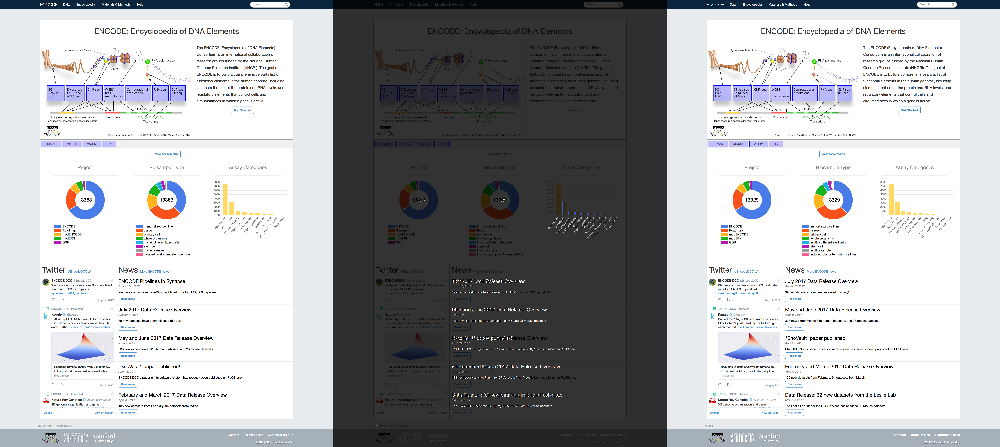

In [11]:
qa.show_differences()

**Compare three random pages from default list:**

In [16]:
qa.find_differences(browsers=['Safari'],
                    users=['Public'],
                    item_types='random')

Opening https://encodeproject.org in Safari
Getting type: /biosamples/ENCBS030ENC/
Loading complete
Taking picture of https://www.encodeproject.org/biosamples/ENCBS030ENC/
/var/folders/v8/vsjvg3vn5mz0nrhvkpp7f0_40000gp/T/tmplpnxl3vv/prod121526589078956467618635144079635019545.png
Opening https://encodeproject.org in Safari
Getting type: /pipelines/ENCPL985BLO/
Loading complete
Taking picture of https://www.encodeproject.org/pipelines/ENCPL985BLO/
/var/folders/v8/vsjvg3vn5mz0nrhvkpp7f0_40000gp/T/tmplpnxl3vv/prod142123383960303874345408967632625553483.png
Opening https://encodeproject.org in Safari
Getting type: /search/?searchTerm=ENCBS619ENC&type=Biosample
Loading complete
Taking picture of https://www.encodeproject.org/search/?searchTerm=ENCBS619ENC&type=Biosample
/var/folders/v8/vsjvg3vn5mz0nrhvkpp7f0_40000gp/T/tmplpnxl3vv/prod223132608811852558900790788544127291303.png
Opening https://test.encodedcc.org/ in Safari
Getting type: /biosamples/ENCBS030ENC/
Loading complete
Taking pictur

[(True, 'safari_BIOSAMPLES_ENCBS030ENC_public_None_prod_rc_diff.png'),
 (False, 'safari_PIPELINES_ENCPL985BLO_public_None_prod_rc_diff.png'),
 (False,
  'safari_SEARCH_SEARCHTERM_ENCBS619ENC_TYPE_BIOSAMPLE_public_None_prod_rc_diff.png')]

**Show difference if any:**

safari_BIOSAMPLES_ENCBS030ENC_public_None_prod_rc_diff.png:


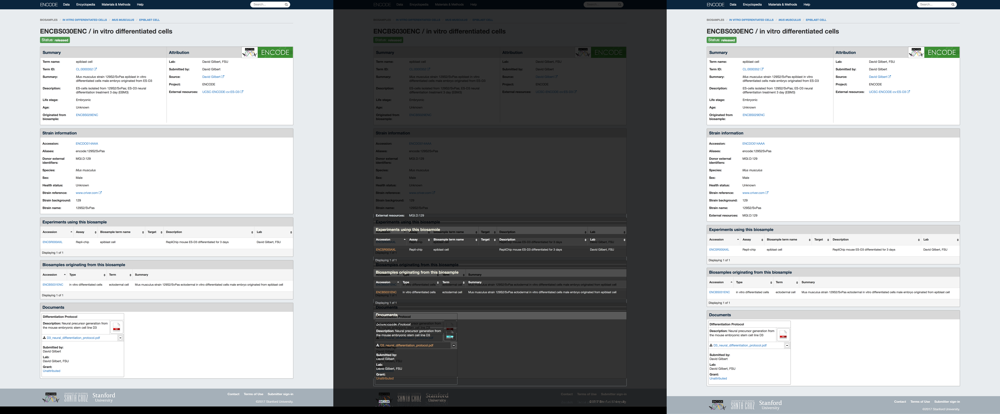

In [17]:
qa.show_differences()

### Default list of action_tuples for find_differences:

In [12]:
qa.find_differences_default_actions

[('/', None),
 ('/targets/?status=deleted', None),
 ('/antibodies/?status=deleted', None),
 ('/search/?type=Biosample&status=deleted', None),
 ('/experiments/ENCSR000CWD/', None),
 ('/biosamples/ENCBS574ZRE/', None),
 ('/biosamples/ENCBS883DWI/', None),
 ('/experiments/ENCSR985KAT/', None),
 ('/biosamples/ENCBS298YPF/', None),
 ('/biosamples/ENCBS142DVU/', None),
 ('/biosamples/ENCBS562NPI/', None),
 ('/human-donors/ENCDO999JZG/', None),
 ('/biosamples/ENCBS615YKY/', None),
 ('/search/?searchTerm=puf60&type=Target', None),
 ('/experiments/ENCSR502NRF/', None),
 ('/experiments/ENCSR000AEH/', None),
 ('/search/?searchTerm=ENCSR000AEH&type=Experiment', None),
 ('/experiments/ENCSR000CPG/', None),
 ('/search/?searchTerm=ENCSR000CPG&type=Experiment', None),
 ('/experiments/ENCSR000BPF/', None),
 ('/search/?searchTerm=ENCSR000BPF&type=Experiment', None),
 ('/experiments/ENCSR178NTX/', None),
 ('/experiments/ENCSR651NGR/', None),
 ('/search/?searchTerm=ENCSR651NGR&type=Experiment', None),
 ('

### Both check_permissions and check_trackhubs use find_differences with custom actions:

In [13]:
qa.check_permissions_default_actions

[('/experiments/ENCSR524OCB/', None),
 ('/experiments/ENCSR000EFT/', None),
 ('/biosamples/ENCBS643IYW/', None),
 ('/experiments/ENCSR466YGC/', None),
 ('/experiments/ENCSR255XZG/', None),
 ('/experiments/ENCSR115BCB/', None),
 ('/files/ENCFF752JWY/', None),
 ('/targets/2L52.1-celegans/', None),
 ('/targets/CG15455-dmelanogaster/', None),
 ('/software/dnase-eval-bam-se/', None),
 ('/software/atac-seq-software-tools/', None),
 ('/software/trimAdapters.py/', None),
 ('/software/bigwigaverageoverbed/', None),
 ('/pipelines/ENCPL493SGC/', None),
 ('/pipelines/ENCPL035XIO/', None),
 ('/pipelines/ENCPL568PWV/', None),
 ('/pipelines/e02448b1-9706-4e7c-b31b-78c921d58f0b/', None),
 ('/pipelines/ENCPL734EDH/', None),
 ('/pipelines/ENCPL983UFZ/', None),
 ('/pipelines/ENCPL631XPY/', None),
 ('/publications/b2e859e6-3ee7-4274-90be-728e0faaa8b9/', None),
 ('/publications/a4db2c6d-d1a3-4e31-b37b-5cc7d6277548/', None),
 ('/publications/16c77add-1bfb-424b-8cab-498ac1e5f6ed/', None),
 ('/publications/da

In [33]:
qa.check_trackhubs_default_actions

[('/experiments/ENCSR502NRF/', qancode.OpenUCSCGenomeBrowserGRCh38),
 ('/experiments/ENCSR502NRF/', qancode.OpenUCSCGenomeBrowserHG19),
 ('/experiments/ENCSR985KAT/', qancode.OpenUCSCGenomeBrowserHG19),
 ('/experiments/ENCSR426UUG/', qancode.OpenUCSCGenomeBrowserGRCh38),
 ('/experiments/ENCSR293WTN/', qancode.OpenUCSCGenomeBrowserMM9),
 ('/experiments/ENCSR335LKF/', qancode.OpenUCSCGenomeBrowserMM10),
 ('/experiments/ENCSR922ESH/', qancode.OpenUCSCGenomeBrowserDM3),
 ('/experiments/ENCSR671XAK/', qancode.OpenUCSCGenomeBrowserDM6),
 ('/experiments/ENCSR422XRE/', qancode.OpenUCSCGenomeBrowserCE10),
 ('/experiments/ENCSR686FKU/', qancode.OpenUCSCGenomeBrowserCE11),
 ('/publication-data/ENCSR764APB/', qancode.OpenUCSCGenomeBrowserHG19),
 ('/projects/ENCSR295OIE/', qancode.OpenUCSCGenomeBrowserHG19),
 ('/annotations/ENCSR212BHV/', qancode.OpenUCSCGenomeBrowserHG19),
 ('/experiments/ENCSR000CJR/', qancode.OpenUCSCGenomeBrowserHG19),
 ('/search/?type=Experiment&assembly=hg19&target.investigat

# Want to check server response time?

### Use check_response_time

_Allows you to specify:_
* List of URLs (by default production and RC)
* List of item_types/subpages (by default None)
* Sample size (number of GET requests to make)

_Outputs mean internal server response time ± standard deviation (in milliseconds) by category:_
* *es_time* - time spent in Elasticsearch
* *render_time* - time spent in JavaScript/React 
* *wsgi_time* - time spent in Python
* *queue_time* - time spent waiting for Apache to pass request to Python
* *total time* - sum of above

_Based on time values in X-Stats field returned by response header._


In [8]:
qa.check_response_time(item_types=[None, '/antibodies/ENCAB284TTY', '/search/?type=Experiment'], n=20)

Checking response time

*** item_type: None
------------------------ https://www.encodeproject.org -------------------------
Average es_time: 20.147 ± 19.571 ms (n=20)
Average queue_time: 0.984 ± 0.527 ms (n=20)
Average render_time: 8.907 ± 2.877 ms (n=20)
Average wsgi_time: 37.488 ± 19.335 ms (n=20)
Average total time: 67.526 ± 39.132 ms (n=20)
-------------------------- https://test.encodedcc.org --------------------------
Average es_time: 5.857 ± 0.666 ms (n=20)
Average queue_time: 1.186 ± 0.725 ms (n=20)
Average render_time: 8.309 ± 1.849 ms (n=20)
Average wsgi_time: 24.428 ± 3.475 ms (n=20)
Average total time: 39.78 ± 5.404 ms (n=20)


*** item_type: /antibodies/ENCAB284TTY
------------- https://www.encodeproject.org/antibodies/ENCAB284TTY -------------
Average es_time: 13.652 ± 10.334 ms (n=20)
Average queue_time: 0.982 ± 0.225 ms (n=20)
Average render_time: 22.442 ± 5.261 ms (n=20)
Average wsgi_time: 50.668 ± 11.051 ms (n=20)
Average total time: 87.744 ± 21.643 ms (n=20)
-------

## Want to check external requests against RC?

### Use check_requests

_Semi-exhaustive grid search of patching/posting/viewing different objects with different statuses:_
    - As users:
        * Public
        * View-only lab (encoded.test@gmail.com)
        * Lab submitter (encoded.test2@gmail.com)
        * Disabled account (encoded.test3@gmail.com)
        * View-only admin (encoded.test4@gmail.com)
        * Admin
    - Overlap with backend pytests and check_permissions()

In [14]:
qa.check_requests()

Trying to get https://v60rc1-master.demo.encodedcc.org/experiments/ENCSR082IHY/ with None as user Public
Expected: 403
Actual: 403
GET SUCCESSFUL

Trying to get https://v60rc1-master.demo.encodedcc.org/experiments/ENCSR082IHY/ with None as user encoded.test2@gmail.com
Expected: 403
Actual: 403
GET SUCCESSFUL

Trying to get https://v60rc1-master.demo.encodedcc.org/experiments/ENCSR082IHY/ with None as user admin
Expected: 200
Actual: 200
GET SUCCESSFUL

Trying to get https://v60rc1-master.demo.encodedcc.org/experiments/ENCSR000CUS with None as user Public
Expected: 200
Actual: 200
GET SUCCESSFUL

Trying to get https://v60rc1-master.demo.encodedcc.org/experiments/ENCSR000CUS with None as user encoded.test2@gmail.com
Expected: 200
Actual: 200
GET SUCCESSFUL

Trying to get https://v60rc1-master.demo.encodedcc.org/experiments/ENCSR000CUS with None as user admin
Expected: 200
Actual: 200
GET SUCCESSFUL

Trying to get https://v60rc1-master.demo.encodedcc.org/experiments/ENCSR524OCB/ with None

In [15]:
qa.check_requests_default_actions

{'get': [('/experiments/ENCSR082IHY/',
   [None],
   [('Public', 403), ('encoded.test2@gmail.com', 403), ('admin', 200)]),
  ('/experiments/ENCSR000CUS',
   [None],
   [('Public', 200), ('encoded.test2@gmail.com', 200), ('admin', 200)]),
  ('/experiments/ENCSR524OCB/',
   [None],
   [('Public', 403),
    ('encoded.test@gmail.com', 200),
    ('encoded.test2@gmail.com', 200),
    ('encoded.test3@gmail.com', 401),
    ('encoded.test4@gmail.com', 200),
    ('admin', 200)]),
  ('/experiments/ENCSR000EFT/',
   [None],
   [('Public', 200),
    ('encoded.test@gmail.com', 200),
    ('encoded.test2@gmail.com', 200),
    ('encoded.test3@gmail.com', 401),
    ('encoded.test4@gmail.com', 200),
    ('admin', 200)]),
  ('/biosamples/ENCBS643IYW/',
   [None],
   [('Public', 403),
    ('encoded.test@gmail.com', 200),
    ('encoded.test2@gmail.com', 200),
    ('encoded.test3@gmail.com', 401),
    ('encoded.test4@gmail.com', 200),
    ('admin', 200)]),
  ('/libraries/ENCLB220SGE/',
   [None],
   [('Publi

## Quick check that important scripts from pyencoded-tools still work?

### Use check_tools

_Runs script from command line against RC with basic arguments and ensures no errors thrown:_
- This is a very surface-level check

In [18]:
qa.check_tools()

Running ENCODE_get_fields.py
/Users/keenan/anaconda/bin/python ENCODE_get_fields.py --key current_rc  --infile ENCSR000CUS --field status
ENCODE_GET_FIELDS.PY SUCCESSFUL
Running ENCODE_patch_set.py
/Users/keenan/anaconda/bin/python ENCODE_patch_set.py --key current_rc --accession ENCSR000CUS --field status --data revoked
ENCODE_PATCH_SET.PY SUCCESSFUL
Running ENCODE_release.py
/Users/keenan/anaconda/bin/python ENCODE_release.py --key current_rc --infile ENCSR000CUS
ENCODE_RELEASE.PY SUCCESSFUL
Running ENCODE_submit_files.py
/Users/keenan/anaconda/bin/python ENCODE_submit_files.py permissions_qa_scripts/Test_submit_files.csv --key current_rc
ENCODE_SUBMIT_FILES.PY SUCCESSFUL
